In [1]:
import pandas as pd
import numpy as np
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

In [4]:
import simulation
from topology import nodes_admix,nodes_simple,events_admix,events_simple
from likelihood import create_nodes_map,mig_matrix,frac_function_pm, expected_ratio,expected_ratio_tensor


TypeError: No model on context stack.

In [6]:
N = [2500,2500,2500,2500,2500]
T = [15,50]
## The length bins we are interested.
L = [0,0.1,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.5,2,2.5,3,3.5,4,4.5,5,100] 

## data_mean reports the matrix of avg sharing fractions between populations, data_var is the bootstrap variance of this avg.
## There are len(L)-1 matrices
data_mean,data_var = simulation.popn3_simple_data(N,T,L,3000,1.7)


AttributeError: module 'simulation' has no attribute 'popn3_simple_data'

In [3]:
#Now calculate the theoratical values
N = [2500,2500,2500,1000,5000]
T = [25,50]
## The length bins we are interested.
L = [0,0.1,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.5,2,2.5,3,3.5,4,4.5,5,100] 
T_ = [0]+T
real_N = [i*2 for i in N]
out = []

 

for i in range(len(L)-1):
    u = L[i]
    v = L[i+1]
    true_mean = expected_ratio(N=real_N,d=3,T=T_,nodes=nodes_simple, events=events_simple,u=u,v=v)
    out.append(true_mean)


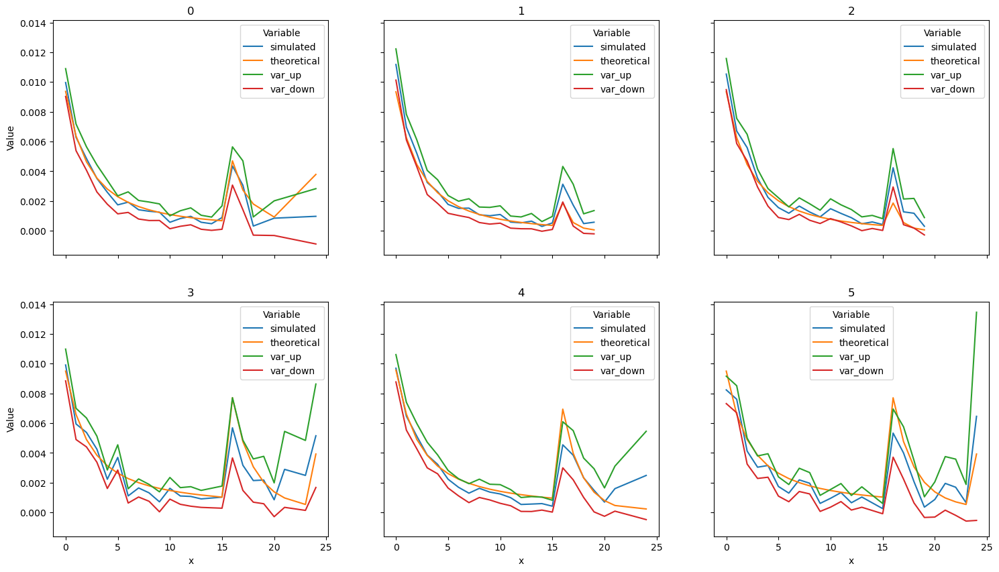

In [12]:
import seaborn as sns
cnt = 0
dfs = []
for i in range(len(data_mean[0])):
    for j in range(i,len(data_mean[0])):
        data = pd.DataFrame({
            'simulated': [a[i][j] for a in data_mean[2:]],
            'theoretical':[a[i][j].item() for a in out[2:]],
            'var_up':[1.96*np.sqrt(a[i][j]) + b[i][j] for a,b in zip(data_var[2:],data_mean[2:])],
            'var_down':[b[i][j]-1.96*np.sqrt(a[i][j]) for a,b in zip(data_var[2:],data_mean[2:])],
            'x' : np.arange(len(data_mean[2:])),
            'group': cnt
        })
        dfs.append(data)
        cnt += 1

data = pd.concat(dfs,ignore_index=True)
dm = data[data['simulated']!=0].melt(id_vars=['x', 'group'], value_vars=['simulated', 'theoretical', 'var_up','var_down'],
                        var_name='Variable', value_name='Value')
fig, axes = plt.subplots(2, 3, figsize=(18, 10), sharex=True, sharey=True)
axes = axes.flatten()

# Plot each group in a subplot
for i, group in enumerate(data['group'].unique()):
    ax = axes[i]
    sns.lineplot(x='x', y='Value', hue='Variable', data=dm[dm['group'] == group], ax=ax)
    ax.set_title(group)
    ax.set_xlabel('x')
    ax.set_ylabel('Value')
    ax.legend(title='Variable')

In [3]:
#qqtest
N = [2500,2500,2500,2500,5000]
T = [25,50]
## The length bins we are interested.
L = [0,0.1,0.25,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.5,2,2.5,3,4,4.5,5,10,170] 
T_ = [0]+T
real_N = [i*2 for i in N]
out = []
length=1e8
morgan=1.7

for i in range(len(L)-1):
    u = L[i]
    v = L[i+1]
    true_mean = expected_ratio(N=real_N,d=3,T=T_,nodes=nodes_simple, events=events_simple,u=u,v=v)
    out.append(true_mean)

## data_mean reports the matrix of avg sharing fractions between populations, data_var is the bootstrap variance of this avg.
## There are len(L)-1 matrices
dfs = []
for k in range(150):

    data_mean,data_var = simulation.popn3_simple_data(N,T,L,1,morgan,length=length)
    cnt = 0
    for i in range(len(data_mean[0])):
        for j in range(i,len(data_mean[0])):
            data = pd.DataFrame({
                'simulated': [a[i][j] for a in data_mean],
                'theoretical':[a[i][j].item() for a in out],
                'x' : np.arange(len(data_mean)),
                'group': cnt
            })
            dfs.append(data)
            cnt += 1

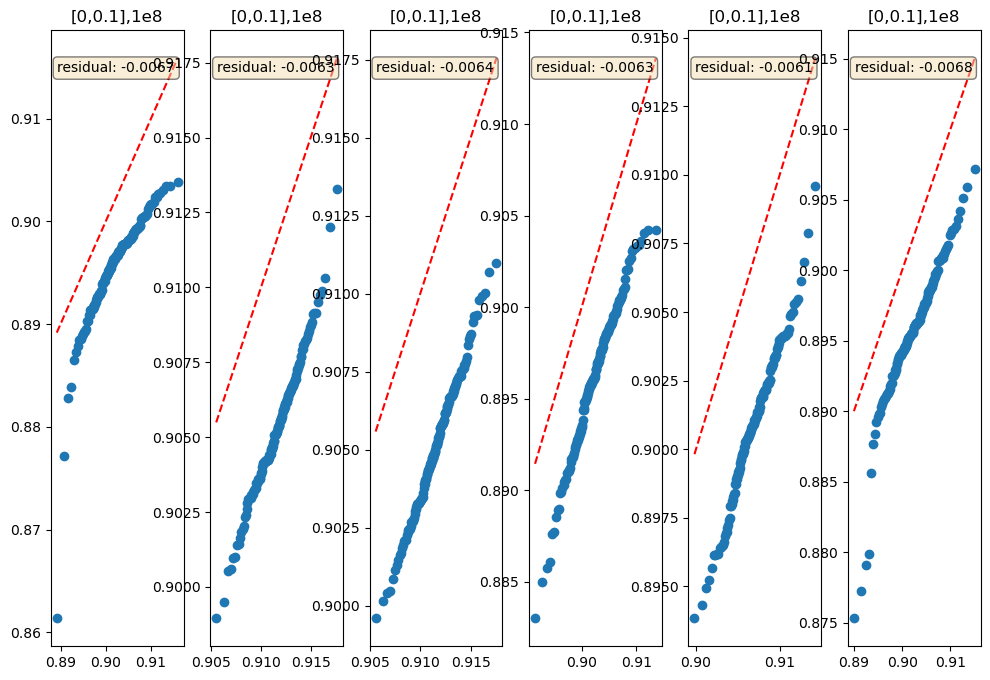

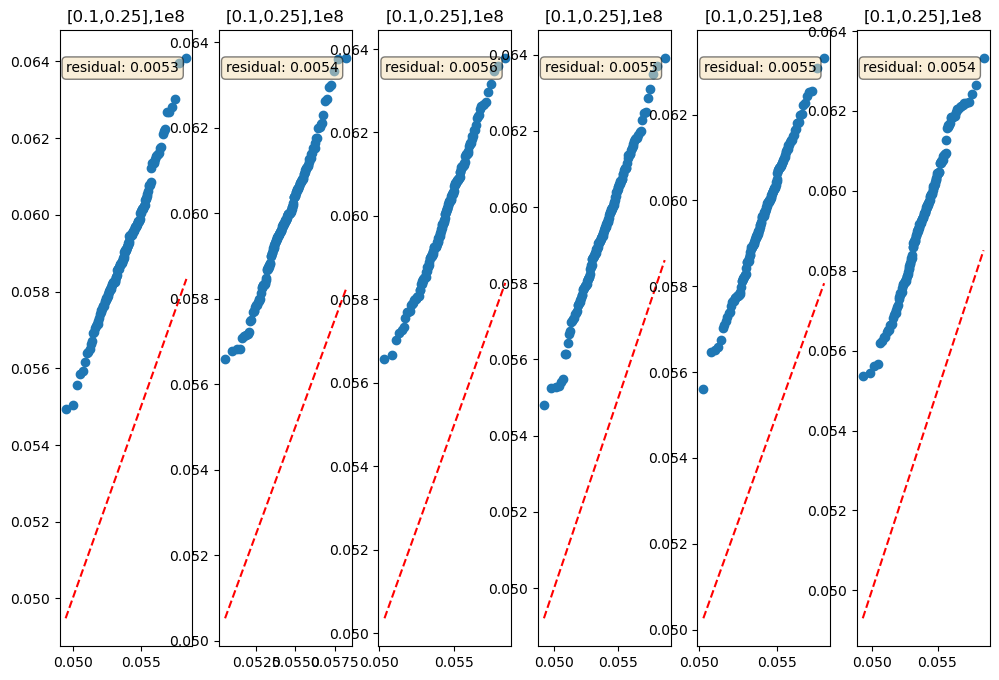

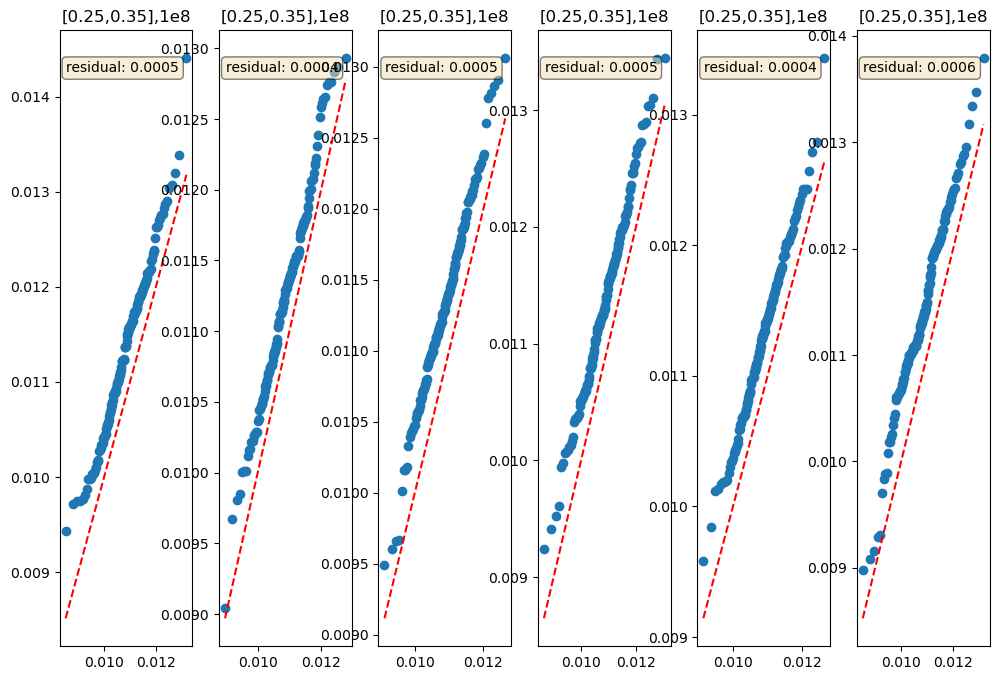

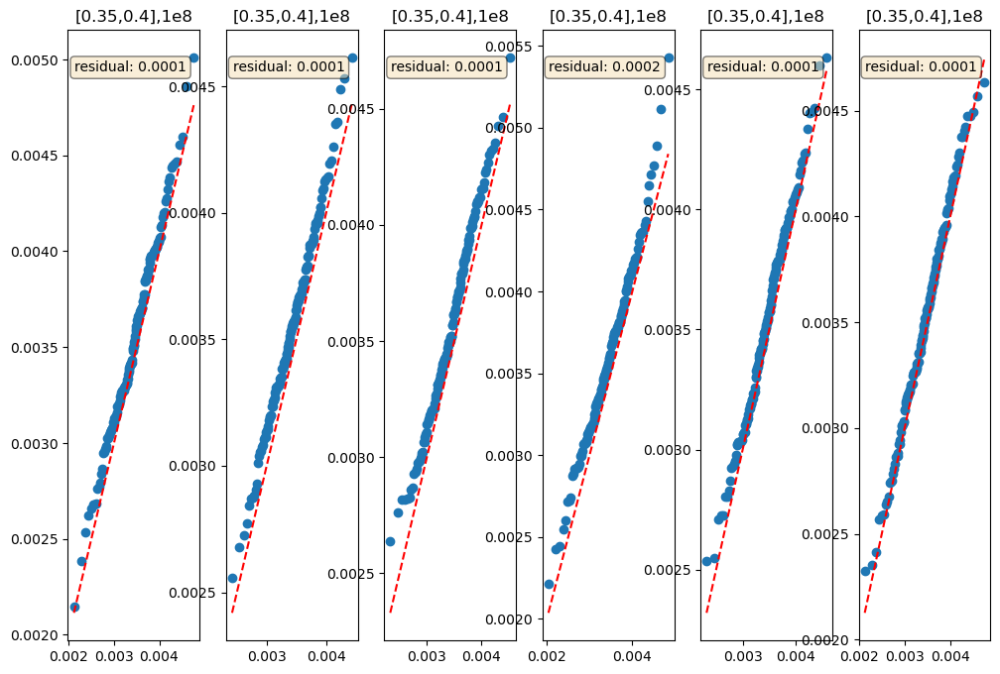

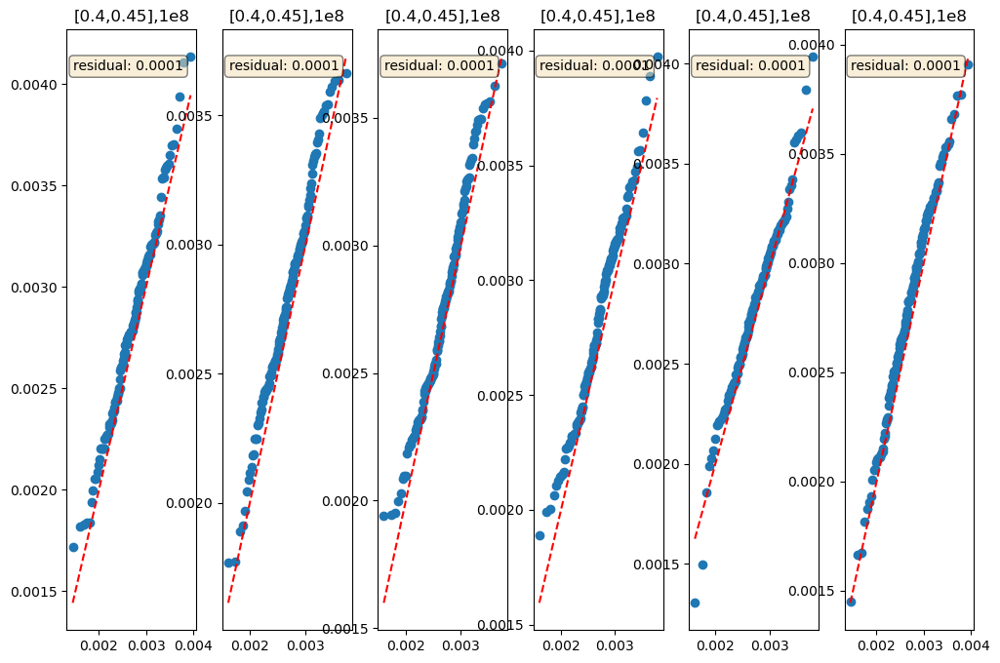

...

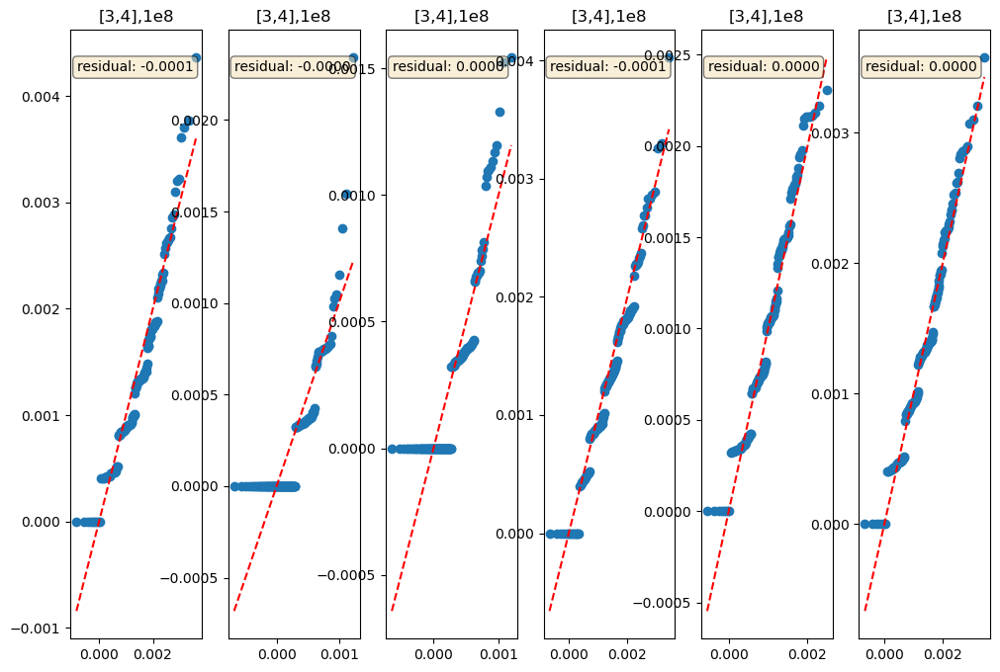

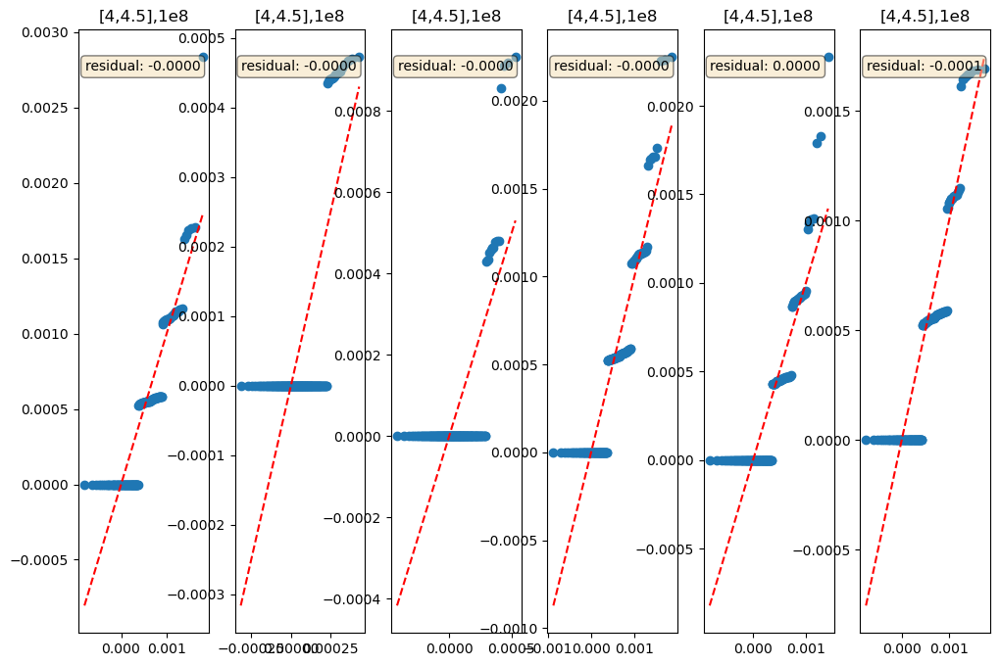

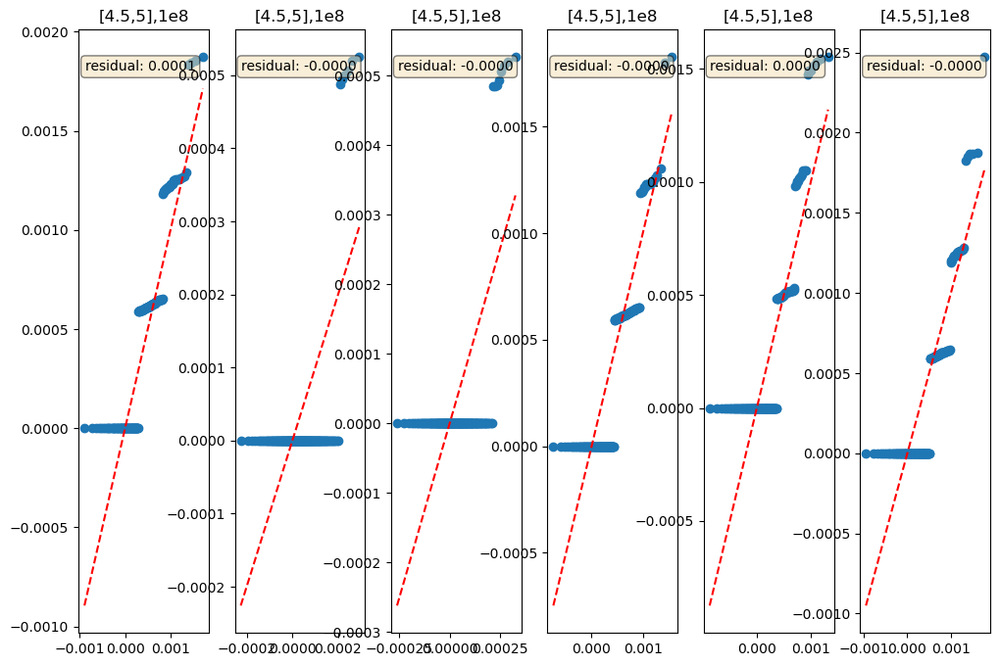

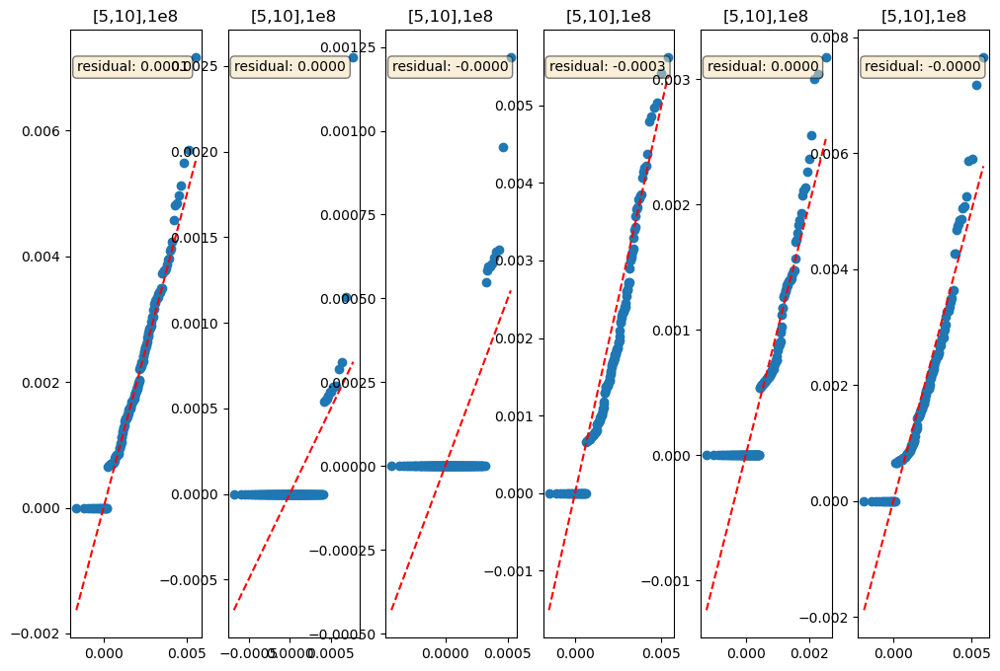

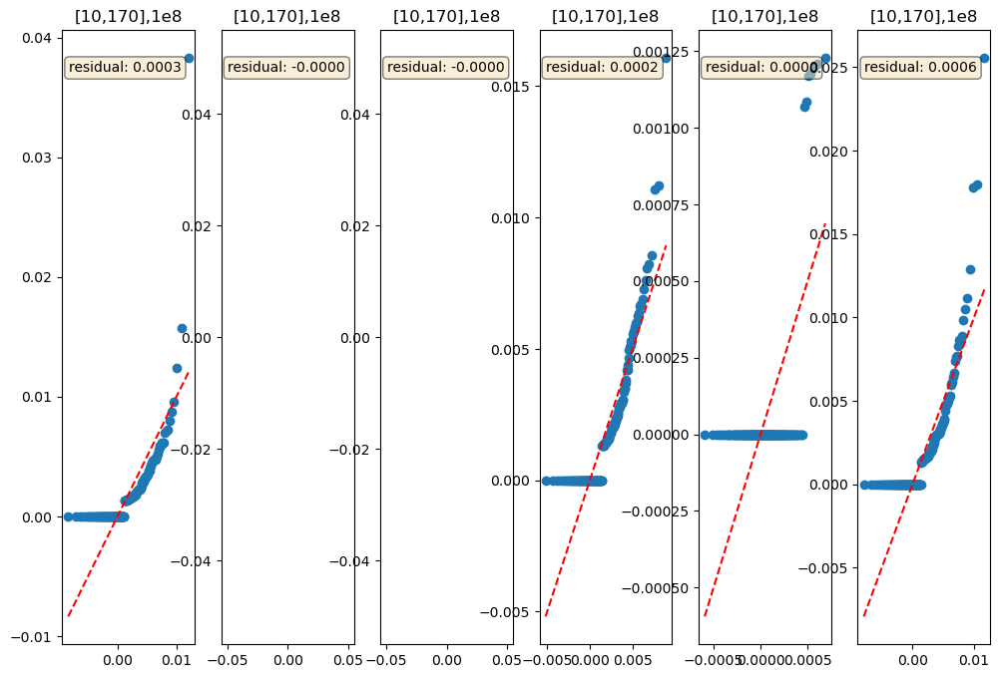

In [6]:
import scipy.stats as stats
D = pd.concat(dfs,ignore_index=True)
for i in range(len(L)-1):
    fig, axs = plt.subplots(1, 6, figsize=(12, 8))
    axs = axs.flatten() 
    for g in range(6):
        data = np.array(D[(D['x']==i)&(D['group']==g)]['simulated'])
        sample_mean = sum(data)/len(data)
        sample_variance = np.var(data, ddof=1)  # Unbiased estimator (N-1 in denominator)
        sample_std = np.sqrt(sample_variance)  # Standard deviation
        given_mean = np.array(D[(D['x']==i)&(D['group']==g)]['theoretical'])[0]
        resid = sample_mean-given_mean
        (res, _) = stats.probplot(data, dist="norm", sparams=(given_mean, sample_std))
        theoretical_quantiles = res[0]
        sample_quantiles = res[1]
        axs[g].scatter(theoretical_quantiles, sample_quantiles, label='Sample Data')
        axs[g].plot(theoretical_quantiles, theoretical_quantiles, color='red', linestyle='--', label='45-degree line')
        axs[g].set_title(f'[{L[i]},{L[i+1]}],1.7,1e8')
        textstr = f'residual: {resid:.4f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        axs[g].text(0.05, 0.95, textstr, transform=axs[g].transAxes, fontsize=10,
                    verticalalignment='top', bbox=props)

    plt.show()

In [7]:
#qqtest
N = [2500,2500,2500,2500,5000]
T = [25,50]
## The length bins we are interested.
L = [0,0.1,0.25,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.5,2,2.5,3,4,4.5,5,10,170] 
T_ = [0]+T
real_N = [i*2 for i in N]
out = []
length=1e6
morgan=1.7

for i in range(len(L)-1):
    u = L[i]
    v = L[i+1]
    true_mean = expected_ratio(N=real_N,d=3,T=T_,nodes=nodes_simple, events=events_simple,u=u,v=v)
    out.append(true_mean)

## data_mean reports the matrix of avg sharing fractions between populations, data_var is the bootstrap variance of this avg.
## There are len(L)-1 matrices
dfs = []
for k in range(150):

    data_mean,data_var = simulation.popn3_simple_data(N,T,L,1,morgan,length=length)
    cnt = 0
    for i in range(len(data_mean[0])):
        for j in range(i,len(data_mean[0])):
            data = pd.DataFrame({
                'simulated': [a[i][j] for a in data_mean],
                'theoretical':[a[i][j].item() for a in out],
                'x' : np.arange(len(data_mean)),
                'group': cnt
            })
            dfs.append(data)
            cnt += 1

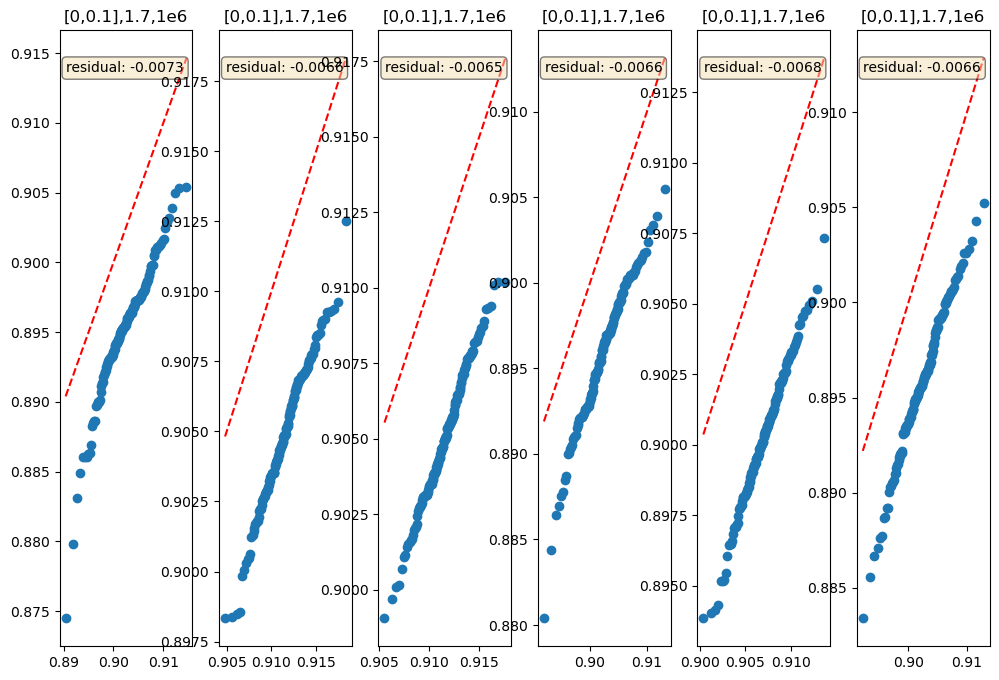

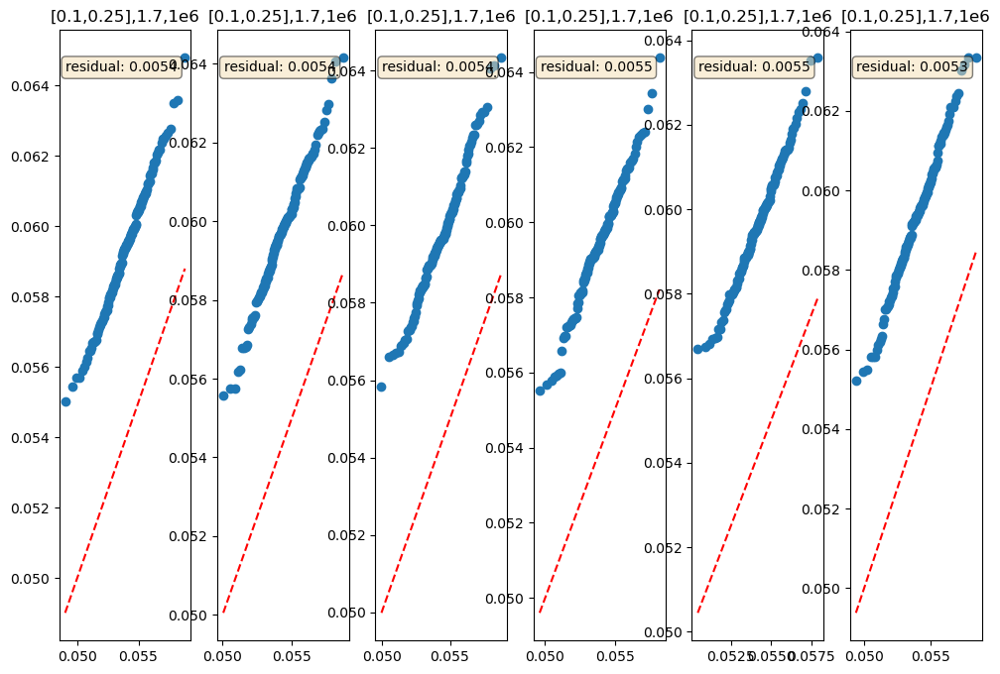

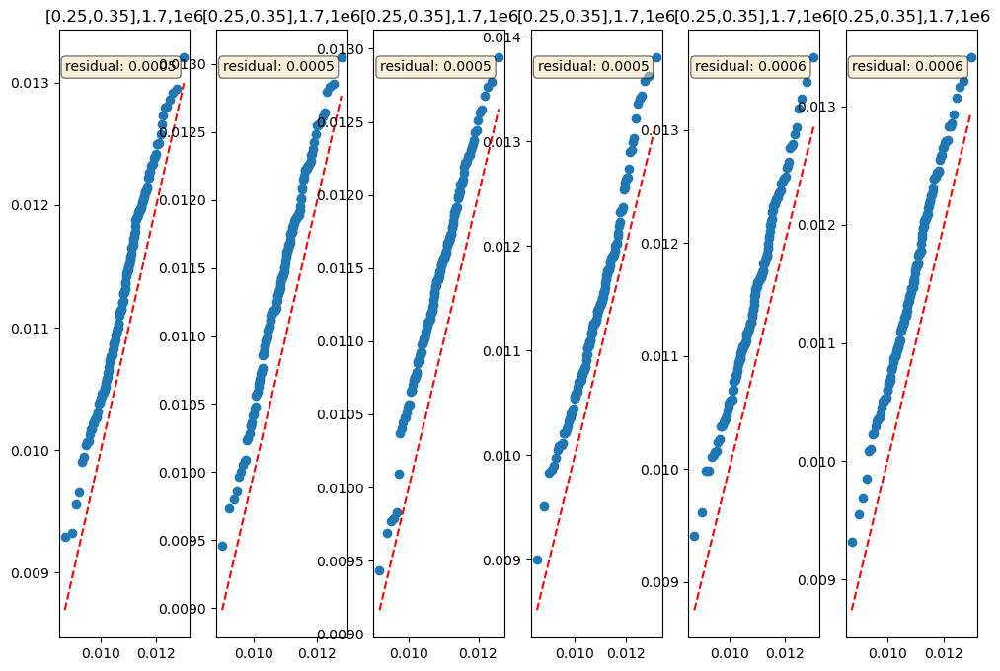

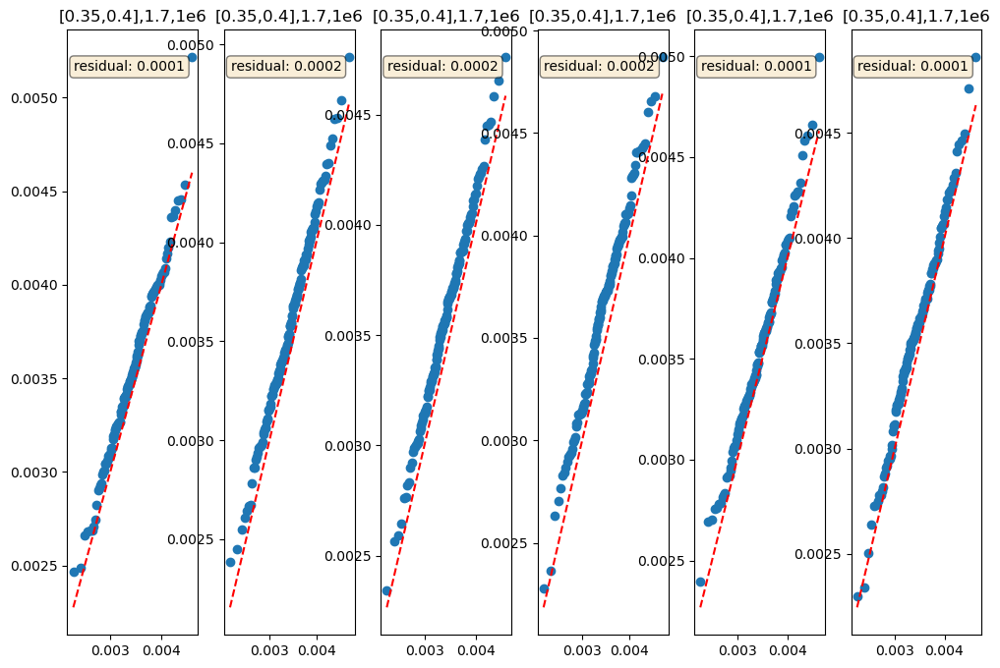

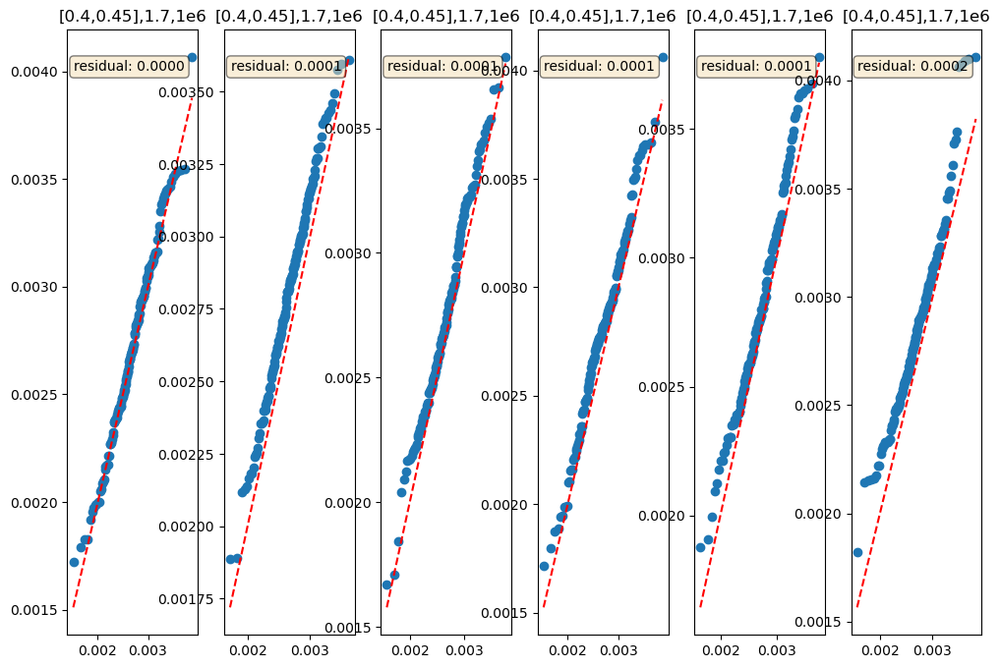

...

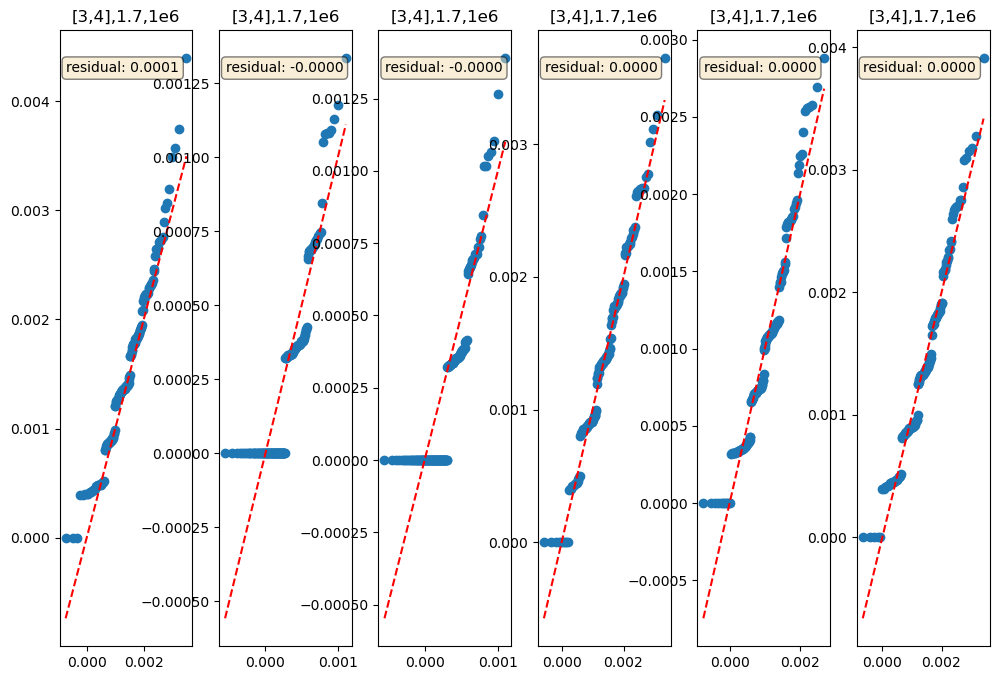

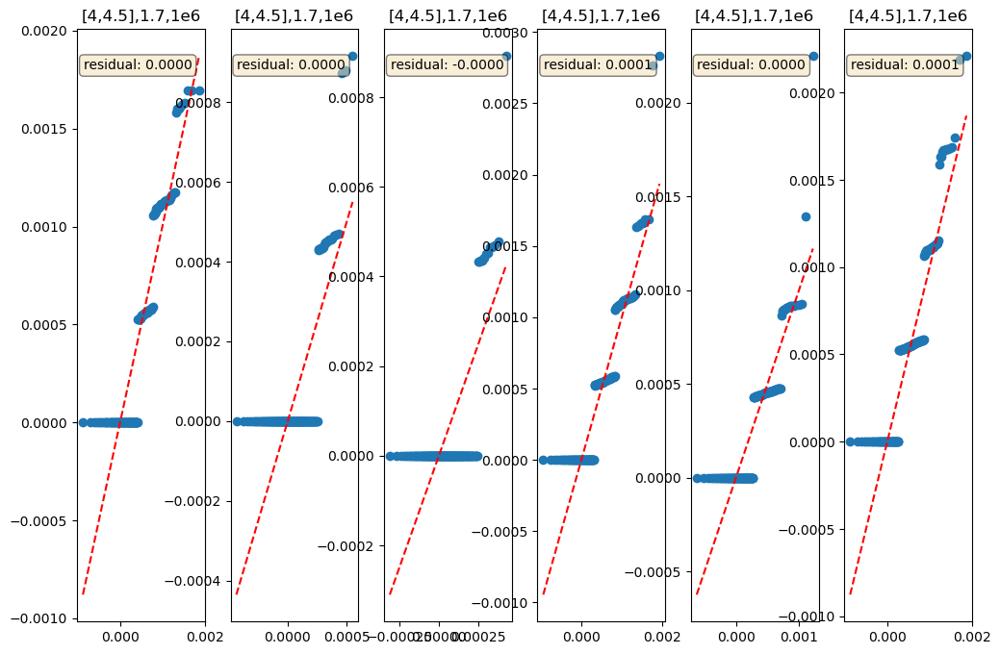

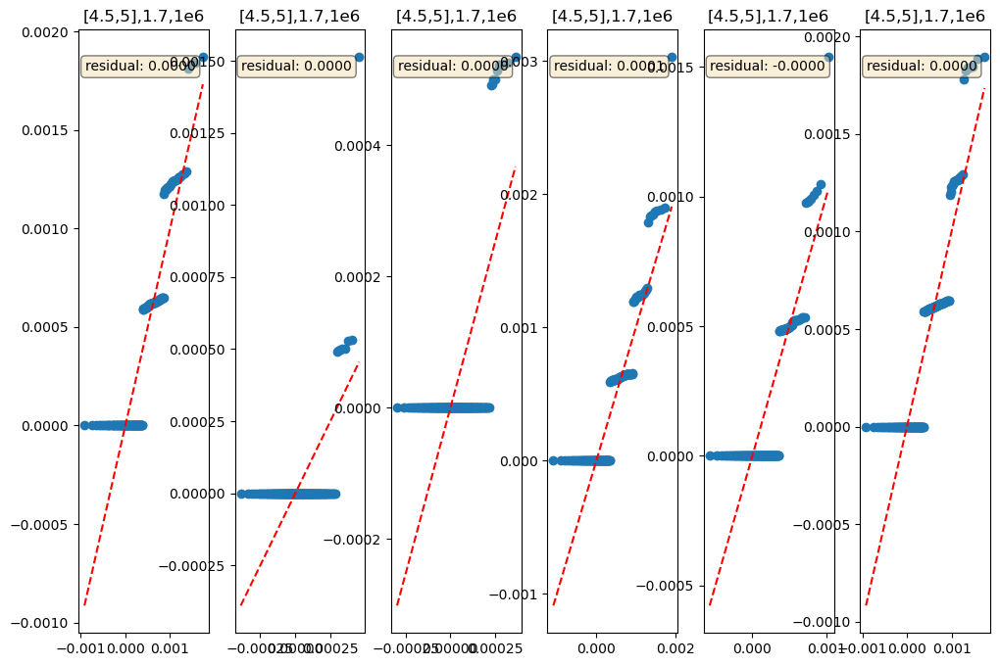

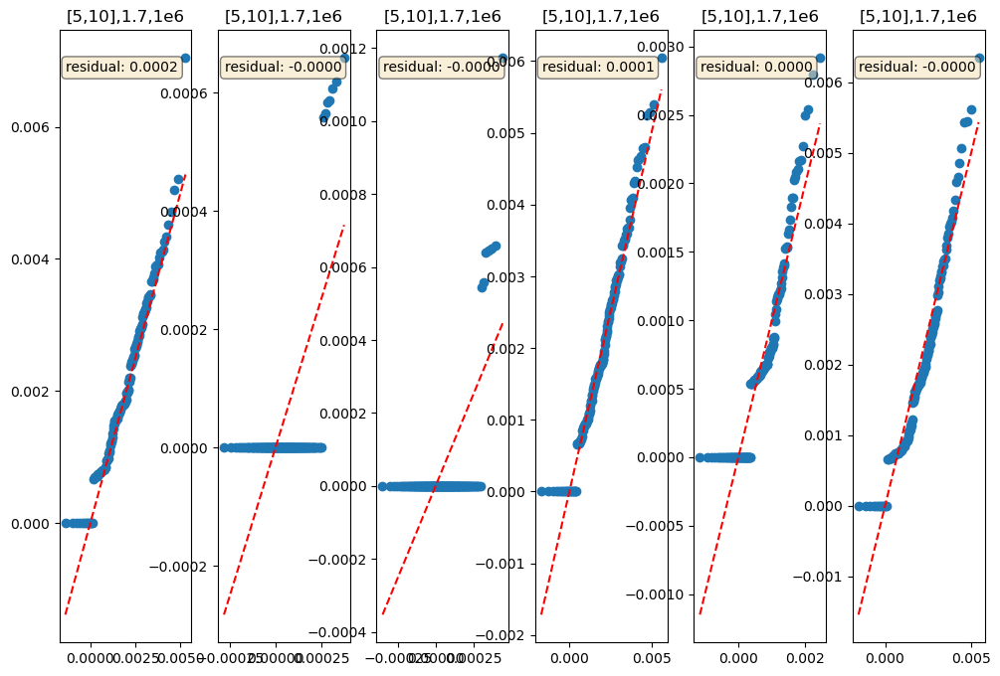

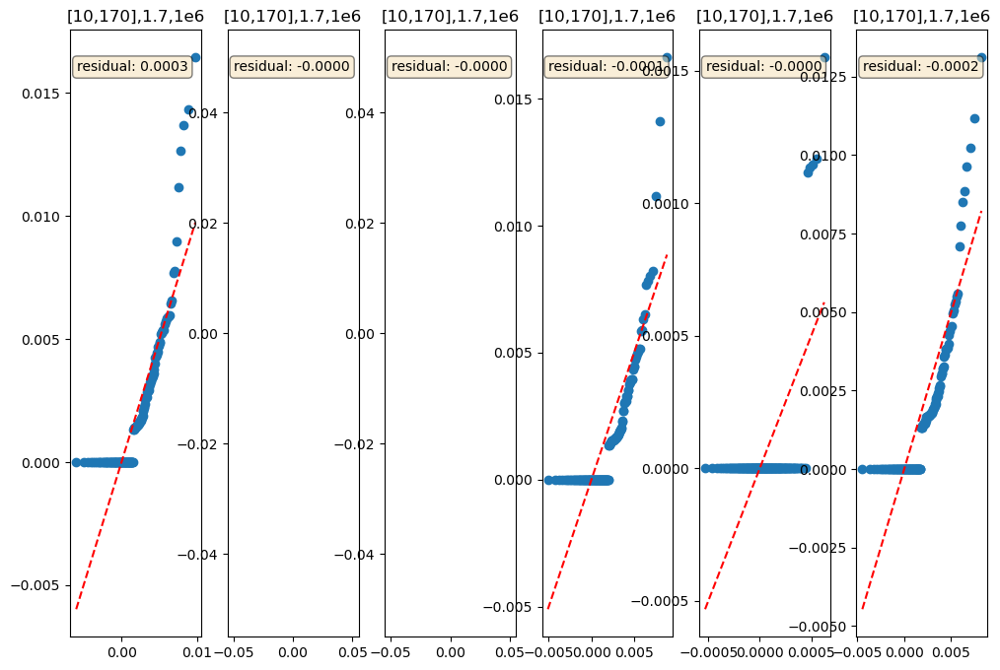

In [8]:
import scipy.stats as stats
D = pd.concat(dfs,ignore_index=True)
for i in range(len(L)-1):
    fig, axs = plt.subplots(1, 6, figsize=(12, 8))
    axs = axs.flatten() 
    for g in range(6):
        data = np.array(D[(D['x']==i)&(D['group']==g)]['simulated'])
        sample_mean = sum(data)/len(data)
        sample_variance = np.var(data, ddof=1)  # Unbiased estimator (N-1 in denominator)
        sample_std = np.sqrt(sample_variance)  # Standard deviation
        given_mean = np.array(D[(D['x']==i)&(D['group']==g)]['theoretical'])[0]
        resid = sample_mean-given_mean
        (res, _) = stats.probplot(data, dist="norm", sparams=(given_mean, sample_std))
        theoretical_quantiles = res[0]
        sample_quantiles = res[1]
        axs[g].scatter(theoretical_quantiles, sample_quantiles, label='Sample Data')
        axs[g].plot(theoretical_quantiles, theoretical_quantiles, color='red', linestyle='--', label='45-degree line')
        axs[g].set_title(f'[{L[i]},{L[i+1]}],1.7,1e6')
        textstr = f'residual: {resid:.4f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        axs[g].text(0.05, 0.95, textstr, transform=axs[g].transAxes, fontsize=10,
                    verticalalignment='top', bbox=props)

    plt.show()

In [9]:
#qqtest
N = [2500,2500,2500,2500,5000]
T = [25,50]
## The length bins we are interested.
L = [0,0.1,0.25,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.5,2,2.5,3,4,4.5,5,10,170] 
T_ = [0]+T
real_N = [i*2 for i in N]
out = []
length=1e6
morgan=5

for i in range(len(L)-1):
    u = L[i]
    v = L[i+1]
    true_mean = expected_ratio(N=real_N,d=3,T=T_,nodes=nodes_simple, events=events_simple,u=u,v=v)
    out.append(true_mean)

## data_mean reports the matrix of avg sharing fractions between populations, data_var is the bootstrap variance of this avg.
## There are len(L)-1 matrices
dfs = []
for k in range(150):

    data_mean,data_var = simulation.popn3_simple_data(N,T,L,1,morgan,length=length)
    cnt = 0
    for i in range(len(data_mean[0])):
        for j in range(i,len(data_mean[0])):
            data = pd.DataFrame({
                'simulated': [a[i][j] for a in data_mean],
                'theoretical':[a[i][j].item() for a in out],
                'x' : np.arange(len(data_mean)),
                'group': cnt
            })
            dfs.append(data)
            cnt += 1

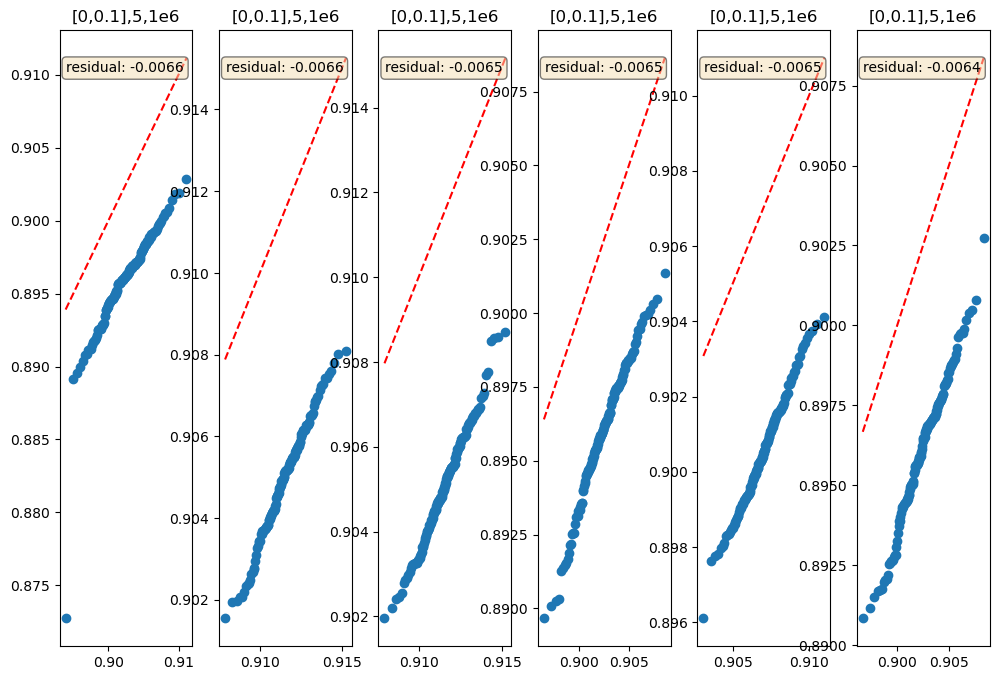

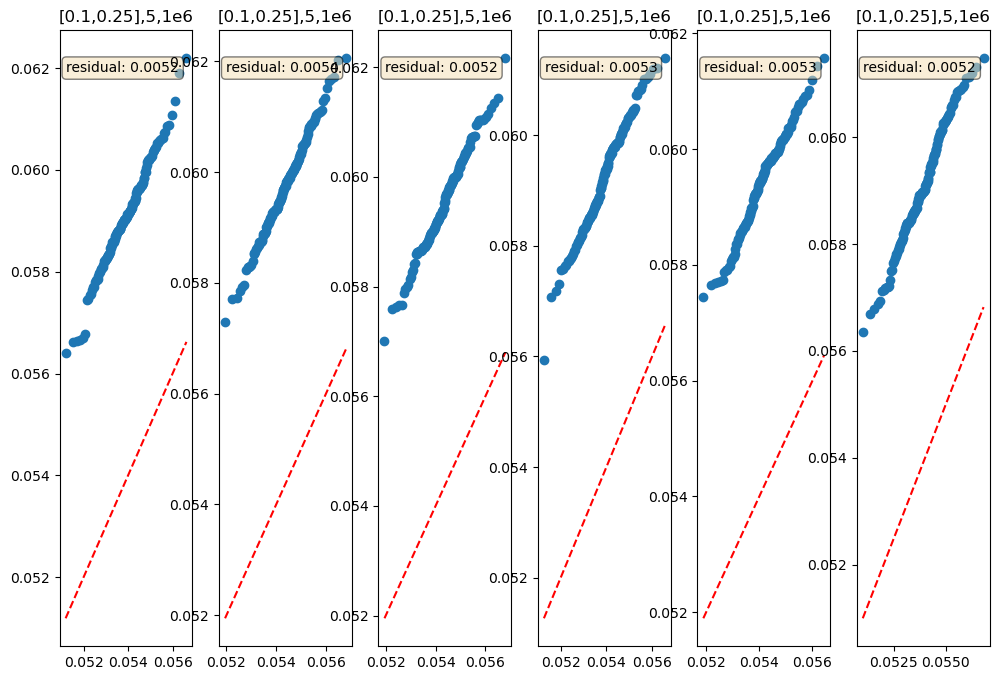

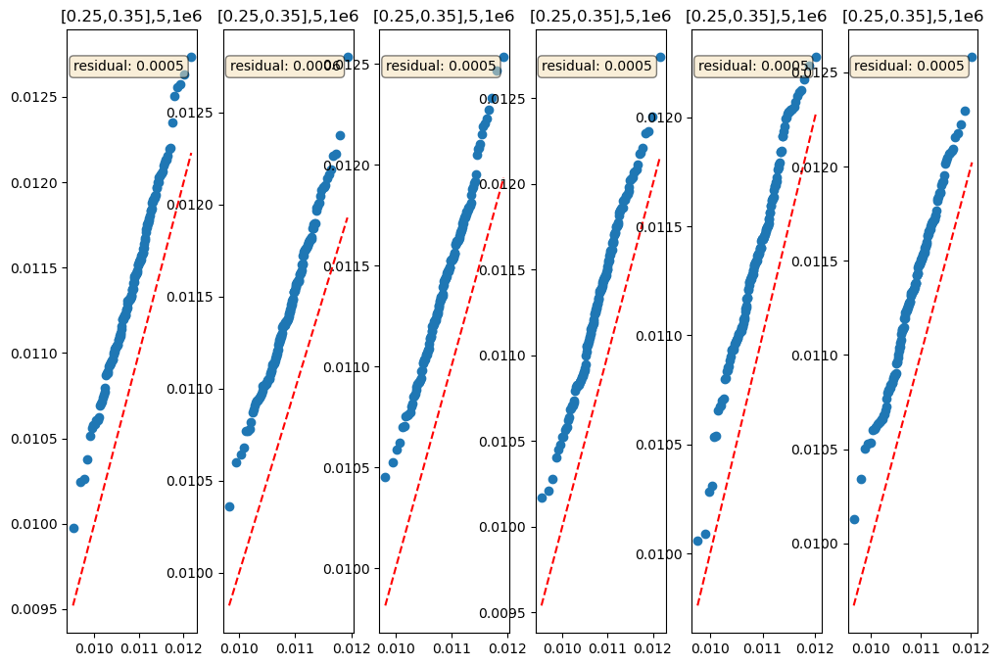

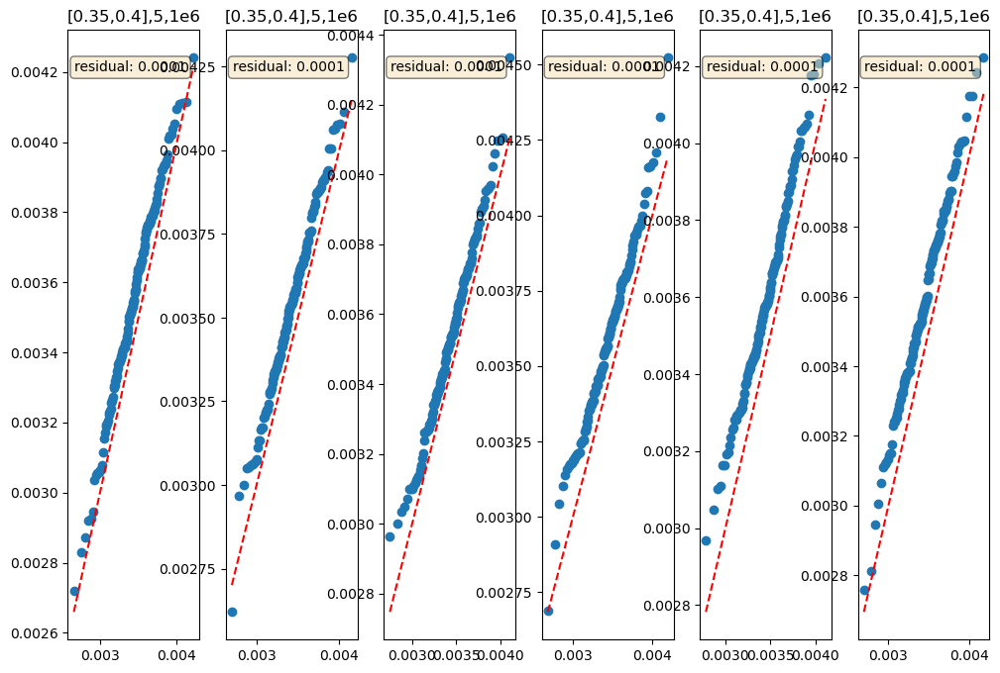

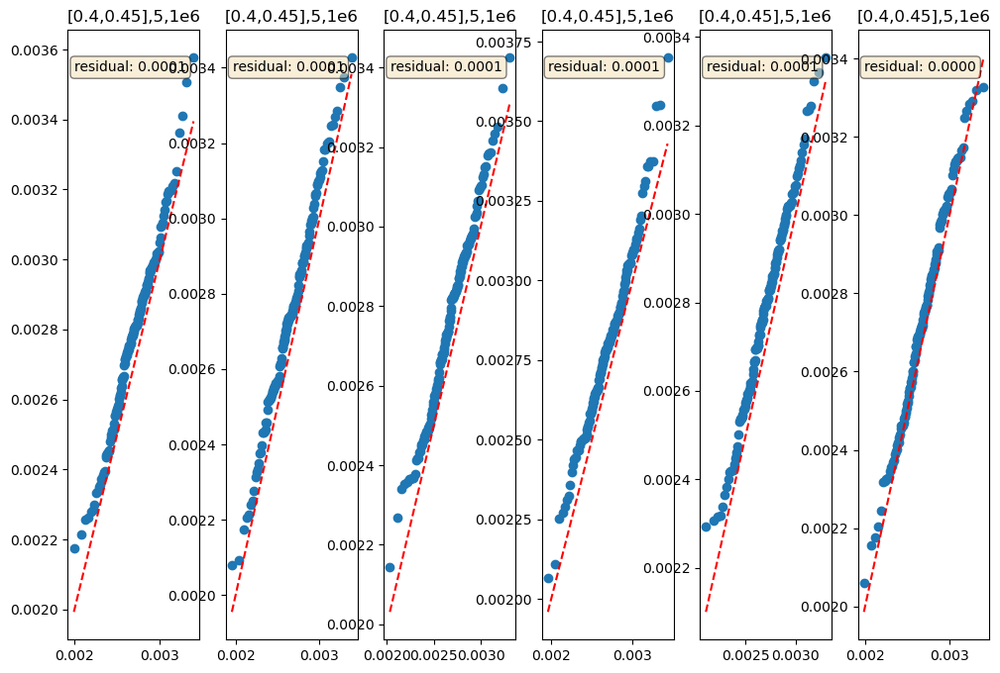

...

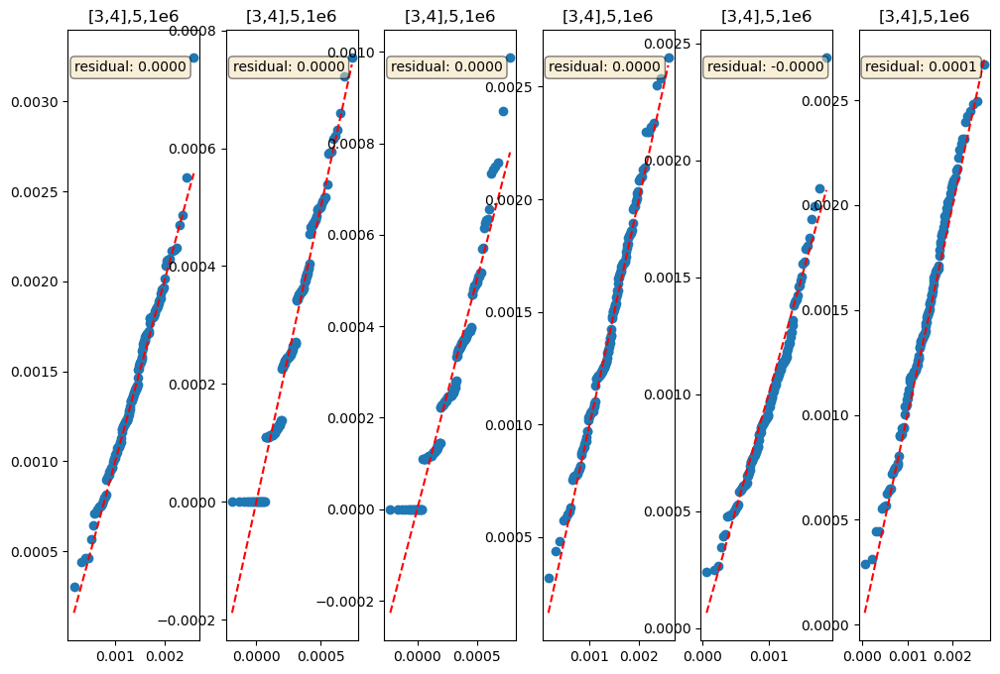

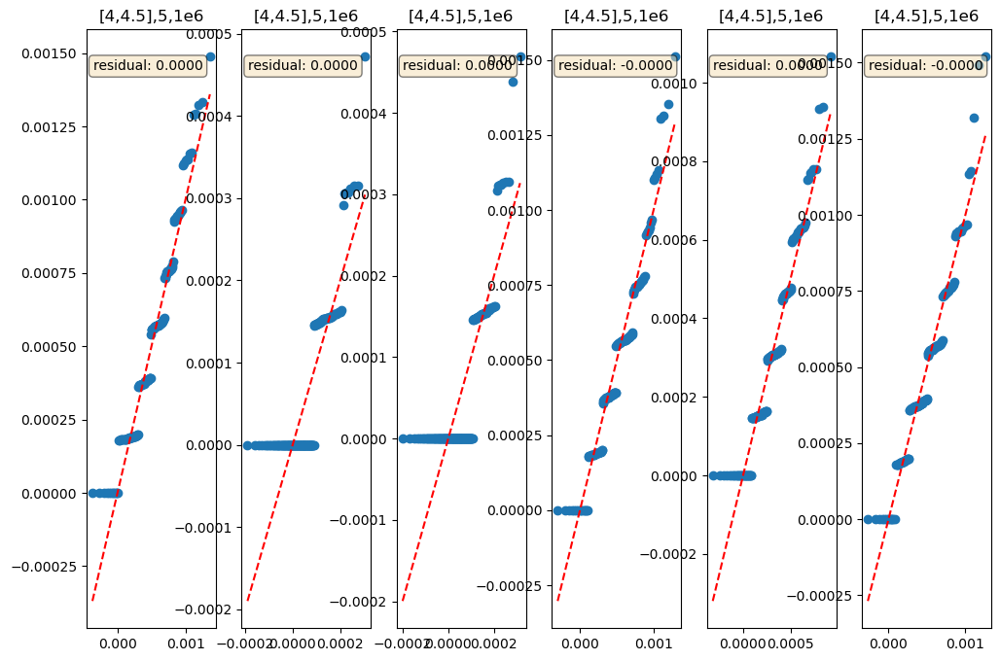

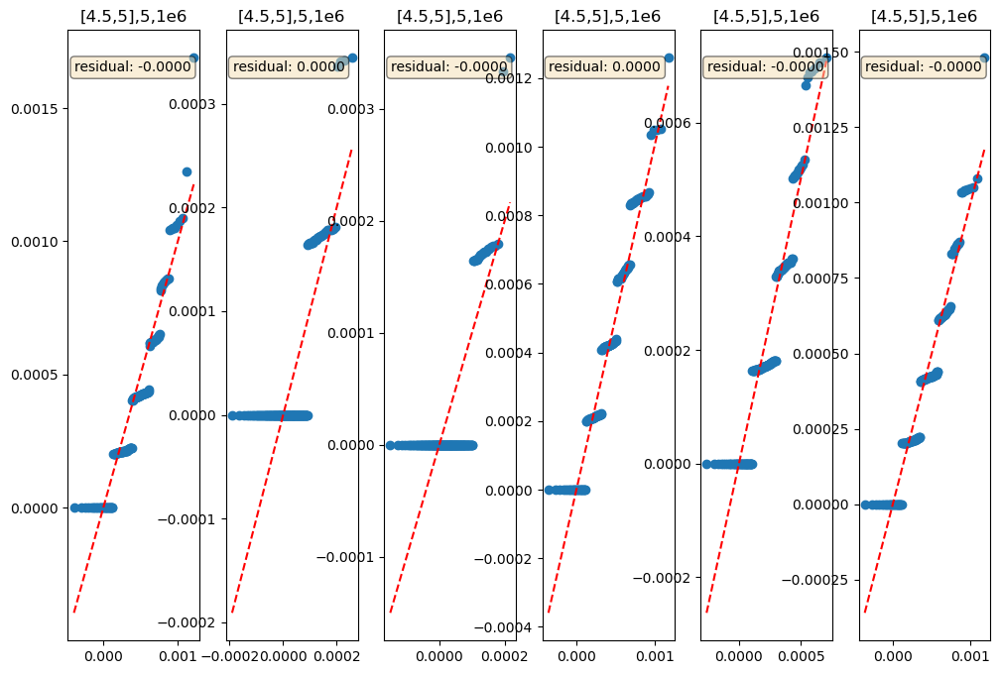

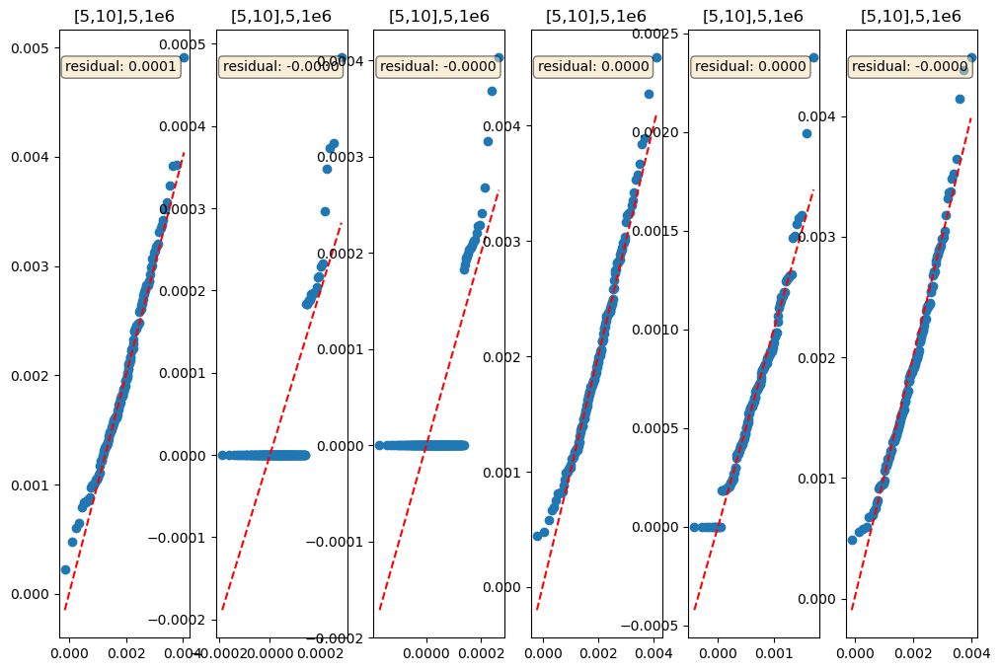

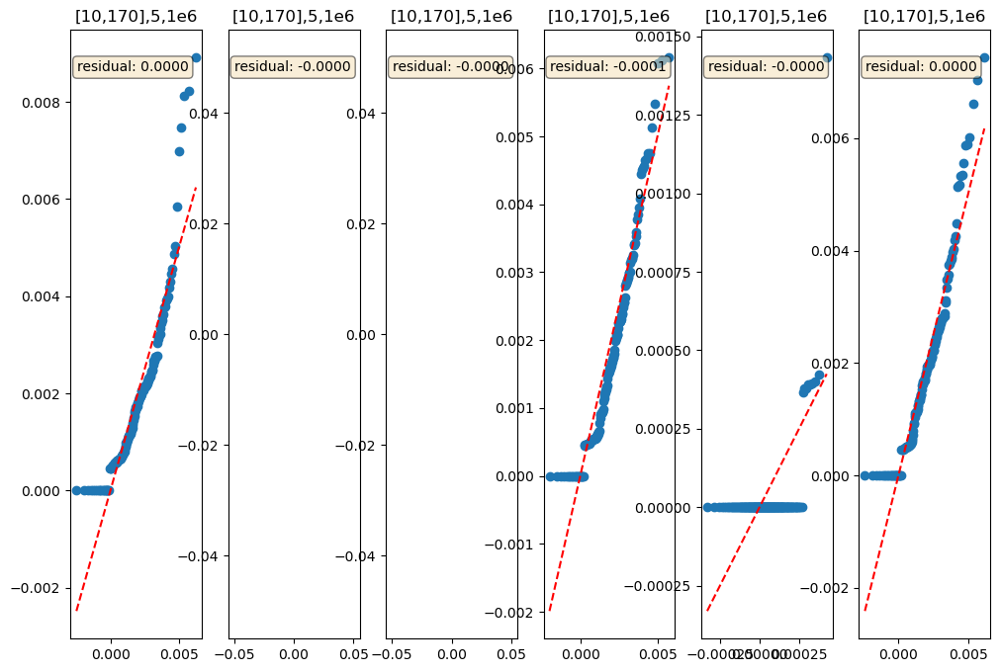

In [10]:
import scipy.stats as stats
D = pd.concat(dfs,ignore_index=True)
for i in range(len(L)-1):
    fig, axs = plt.subplots(1, 6, figsize=(12, 8))
    axs = axs.flatten() 
    for g in range(6):
        data = np.array(D[(D['x']==i)&(D['group']==g)]['simulated'])
        sample_mean = sum(data)/len(data)
        sample_variance = np.var(data, ddof=1)  # Unbiased estimator (N-1 in denominator)
        sample_std = np.sqrt(sample_variance)  # Standard deviation
        given_mean = np.array(D[(D['x']==i)&(D['group']==g)]['theoretical'])[0]
        resid = sample_mean-given_mean
        (res, _) = stats.probplot(data, dist="norm", sparams=(given_mean, sample_std))
        theoretical_quantiles = res[0]
        sample_quantiles = res[1]
        axs[g].scatter(theoretical_quantiles, sample_quantiles, label='Sample Data')
        axs[g].plot(theoretical_quantiles, theoretical_quantiles, color='red', linestyle='--', label='45-degree line')
        axs[g].set_title(f'[{L[i]},{L[i+1]}],5,1e6')
        textstr = f'residual: {resid:.4f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        axs[g].text(0.05, 0.95, textstr, transform=axs[g].transAxes, fontsize=10,
                    verticalalignment='top', bbox=props)

    plt.show()

In [11]:
#qqtest
N = [2500,2500,2500,2500,5000]
T = [25,50]
## The length bins we are interested.
L = [0,0.1,0.25,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.5,2,2.5,3,4,4.5,5,10,170] 
T_ = [0]+T
real_N = [i*2 for i in N]
out = []
length=1e8
morgan=10

for i in range(len(L)-1):
    u = L[i]
    v = L[i+1]
    true_mean = expected_ratio(N=real_N,d=3,T=T_,nodes=nodes_simple, events=events_simple,u=u,v=v)
    out.append(true_mean)

## data_mean reports the matrix of avg sharing fractions between populations, data_var is the bootstrap variance of this avg.
## There are len(L)-1 matrices
dfs = []
for k in range(150):

    data_mean,data_var = simulation.popn3_simple_data(N,T,L,1,morgan,length=length)
    cnt = 0
    for i in range(len(data_mean[0])):
        for j in range(i,len(data_mean[0])):
            data = pd.DataFrame({
                'simulated': [a[i][j] for a in data_mean],
                'theoretical':[a[i][j].item() for a in out],
                'x' : np.arange(len(data_mean)),
                'group': cnt
            })
            dfs.append(data)
            cnt += 1

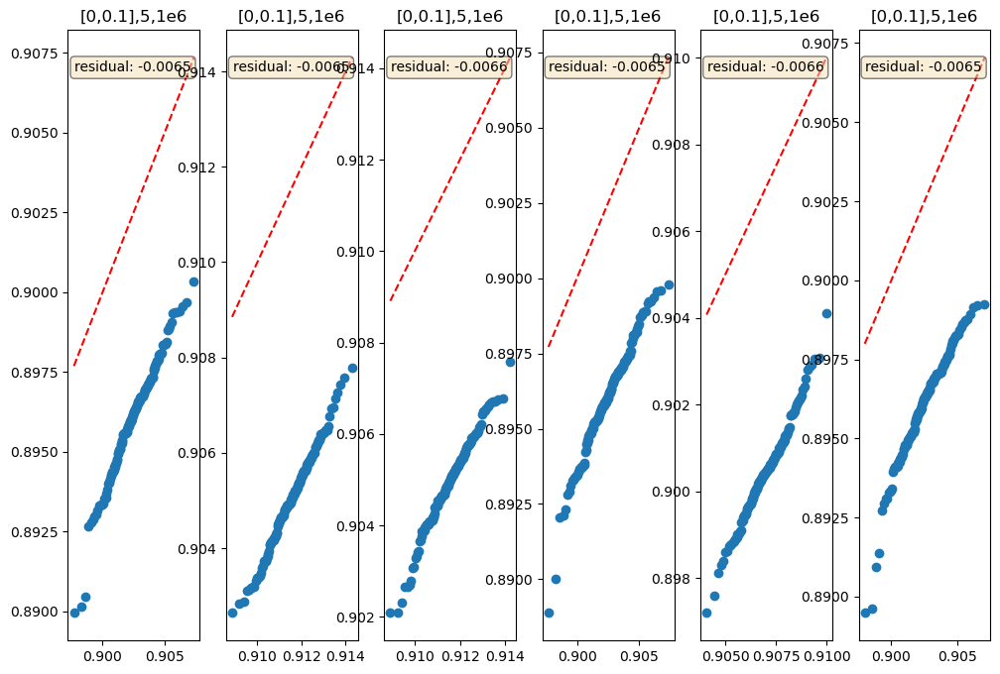

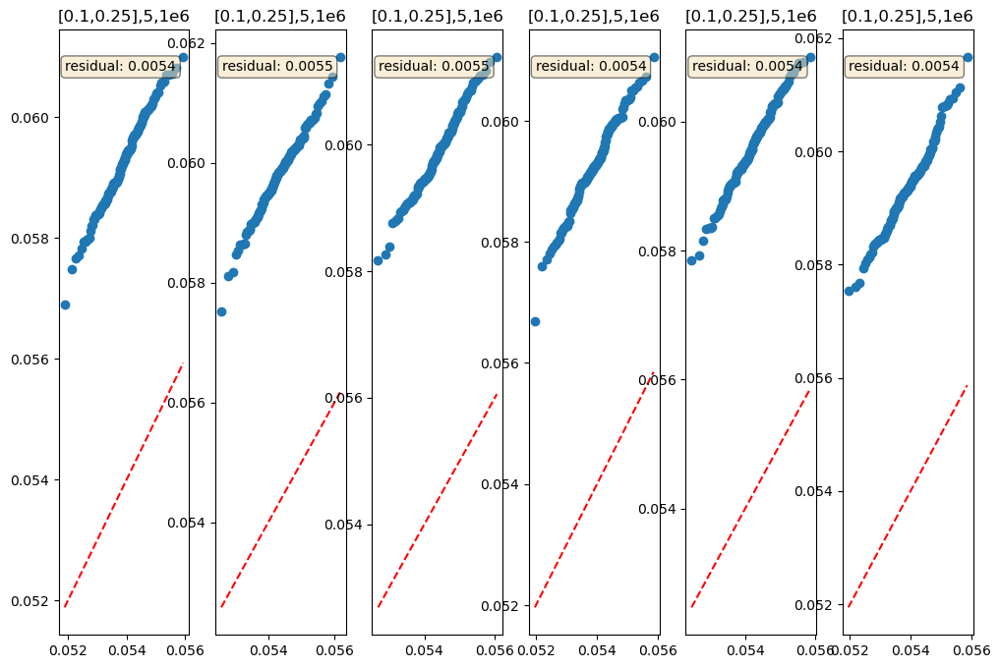

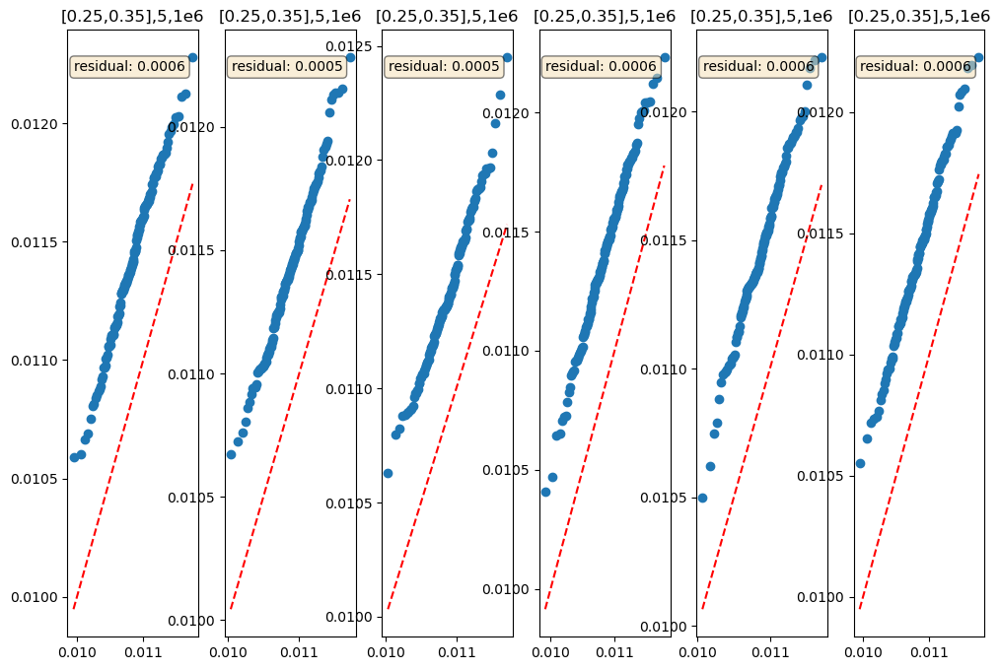

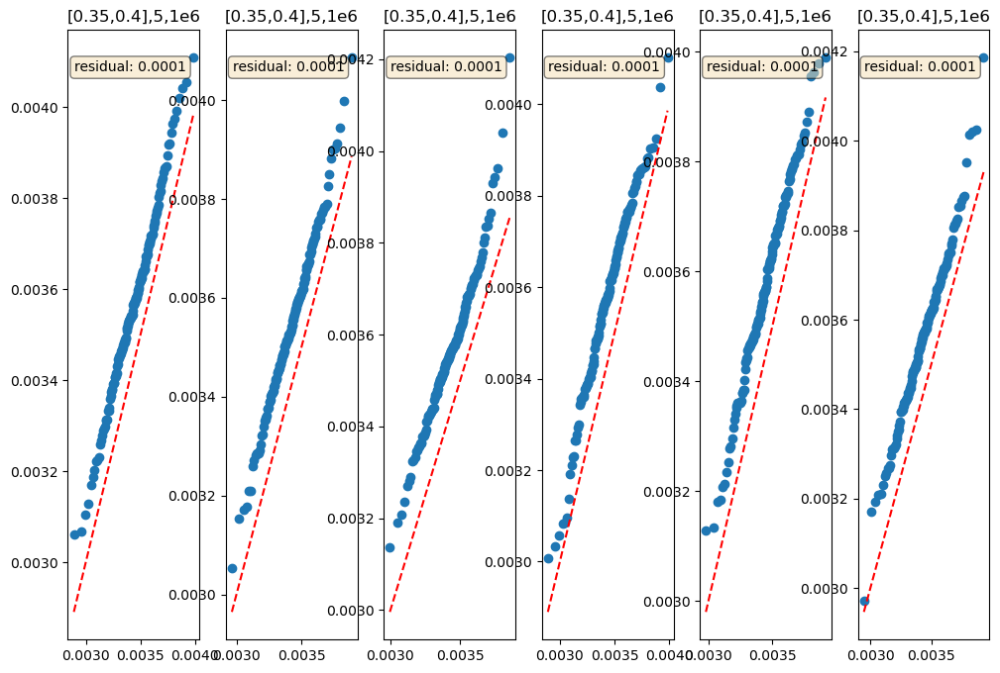

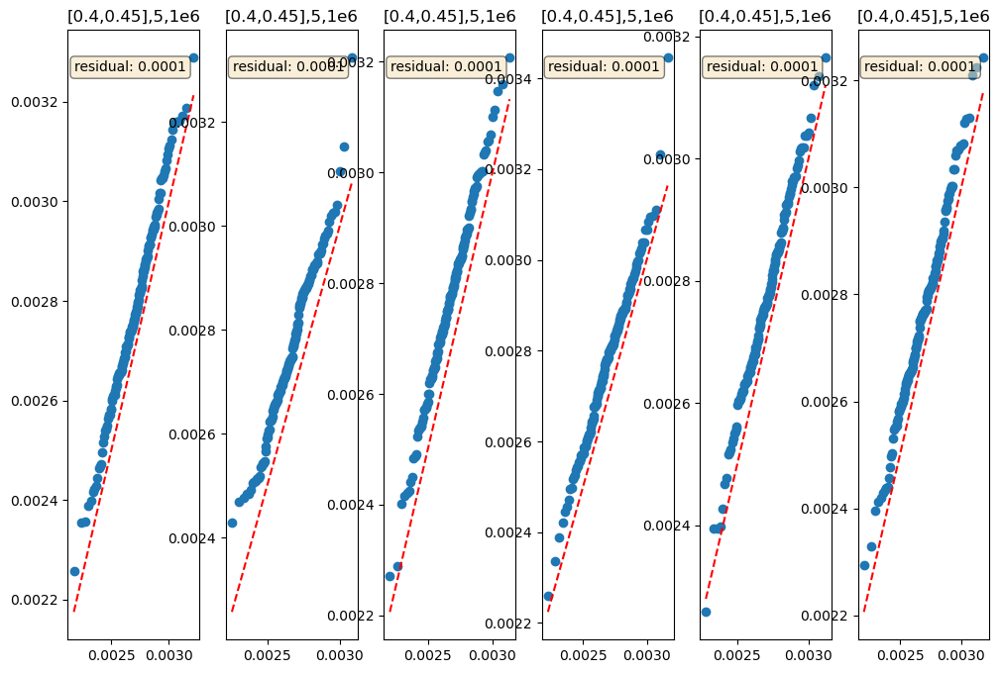

...

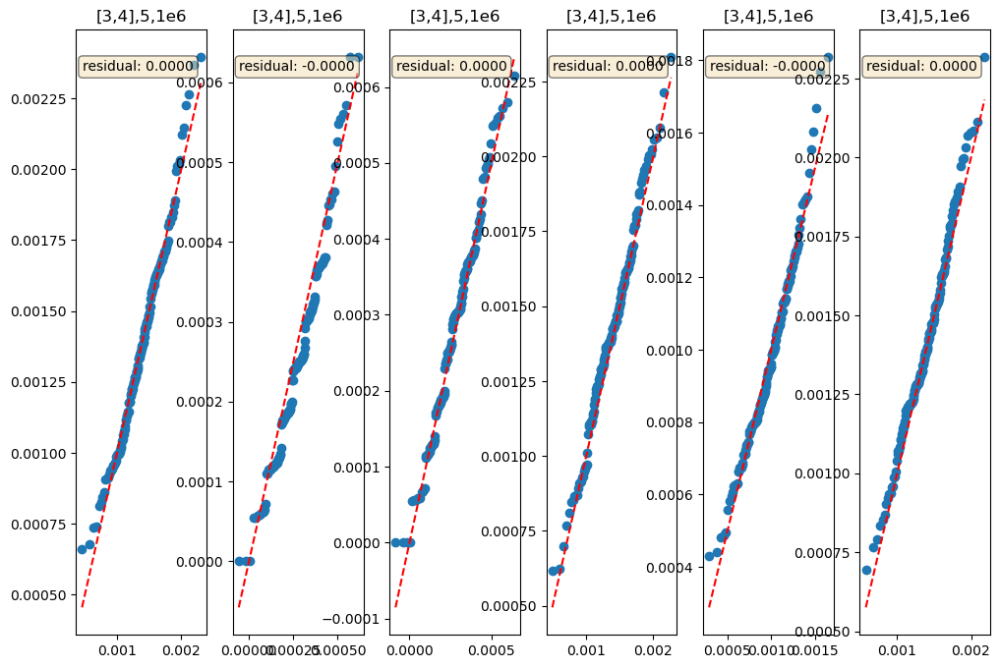

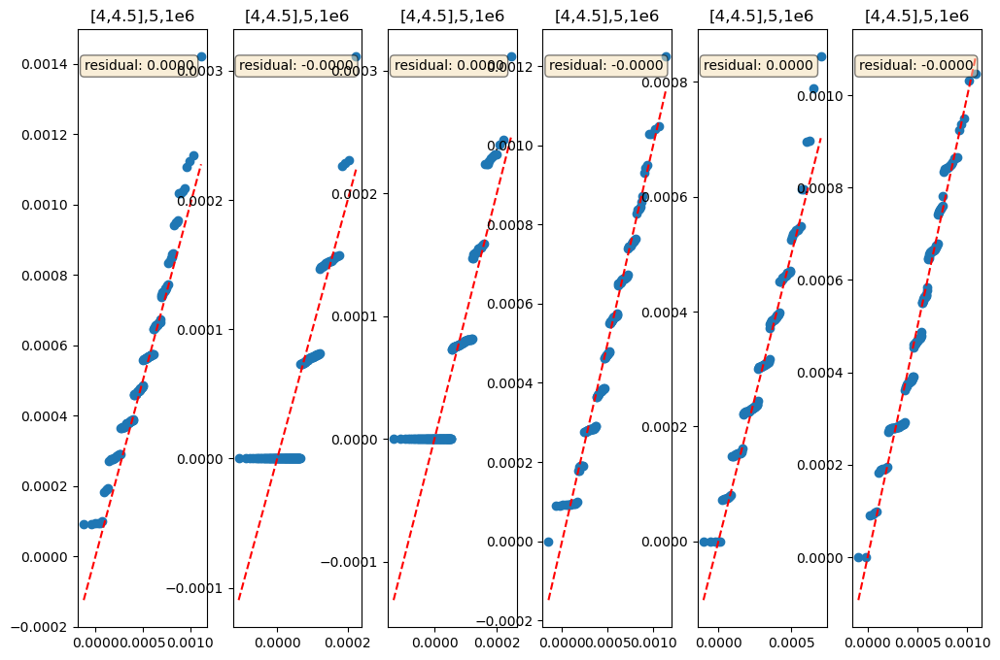

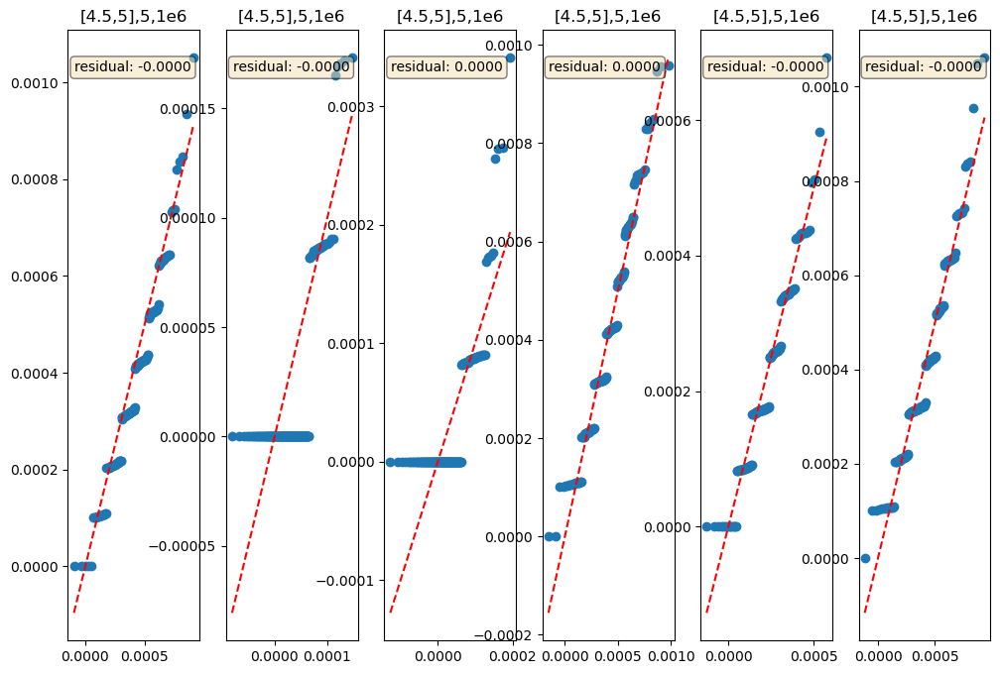

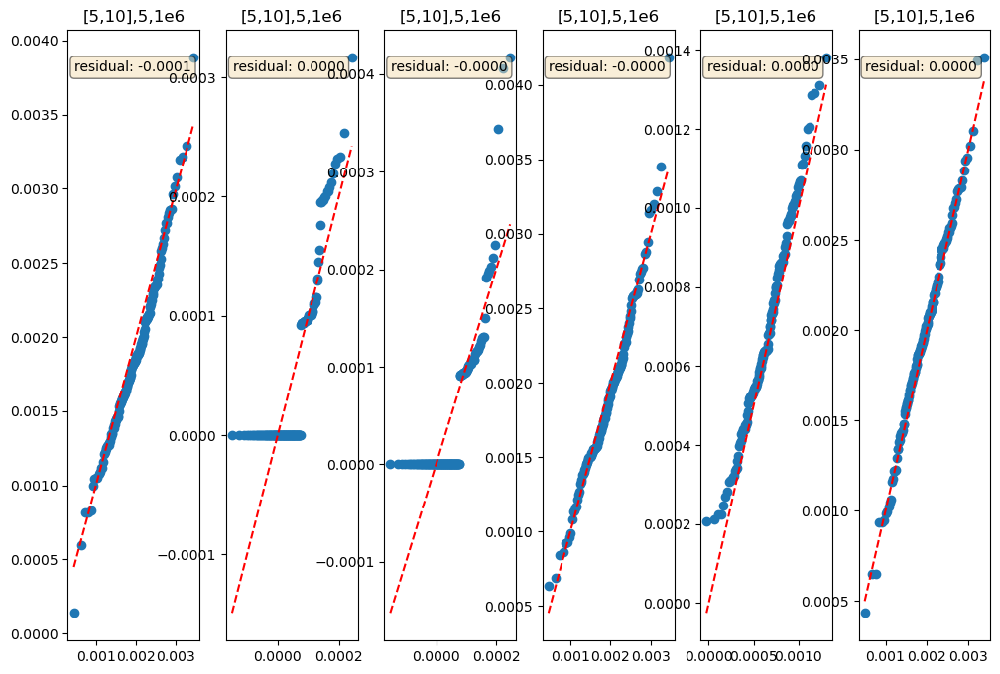

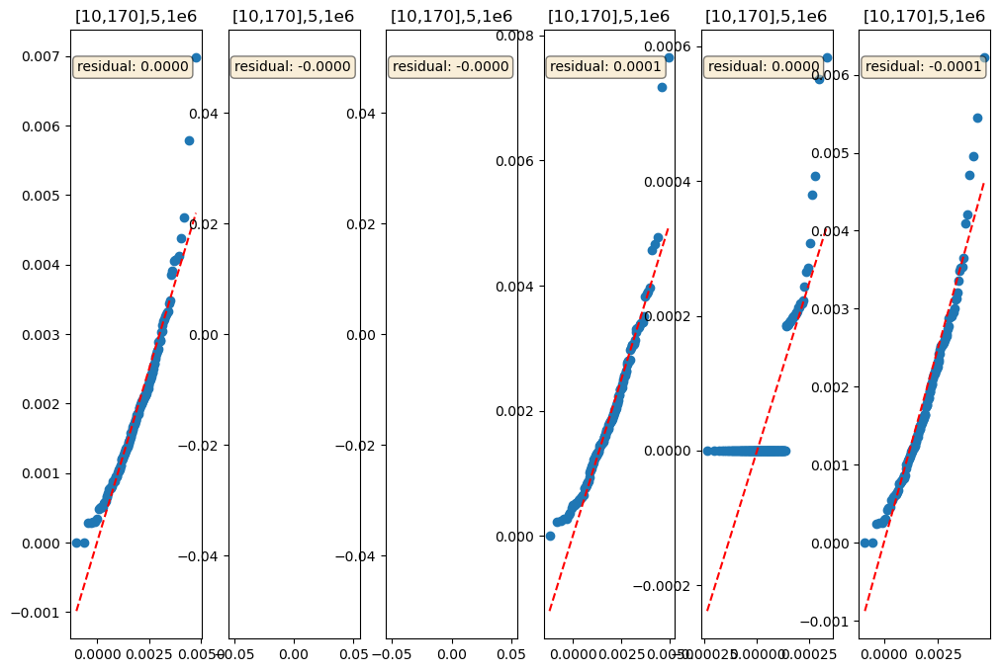

In [12]:
import scipy.stats as stats
D = pd.concat(dfs,ignore_index=True)
for i in range(len(L)-1):
    fig, axs = plt.subplots(1, 6, figsize=(12, 8))
    axs = axs.flatten() 
    for g in range(6):
        data = np.array(D[(D['x']==i)&(D['group']==g)]['simulated'])
        sample_mean = sum(data)/len(data)
        sample_variance = np.var(data, ddof=1)  # Unbiased estimator (N-1 in denominator)
        sample_std = np.sqrt(sample_variance)  # Standard deviation
        given_mean = np.array(D[(D['x']==i)&(D['group']==g)]['theoretical'])[0]
        resid = sample_mean-given_mean
        (res, _) = stats.probplot(data, dist="norm", sparams=(given_mean, sample_std))
        theoretical_quantiles = res[0]
        sample_quantiles = res[1]
        axs[g].scatter(theoretical_quantiles, sample_quantiles, label='Sample Data')
        axs[g].plot(theoretical_quantiles, theoretical_quantiles, color='red', linestyle='--', label='45-degree line')
        axs[g].set_title(f'[{L[i]},{L[i+1]}],5,1e6')
        textstr = f'residual: {resid:.4f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        axs[g].text(0.05, 0.95, textstr, transform=axs[g].transAxes, fontsize=10,
                    verticalalignment='top', bbox=props)

    plt.show()

In [11]:
with pm.Model() as basic_model:
    N1 = pm.Gamma('N1',alpha = 25,beta = 0.005)
    N2 = pm.Gamma('N2',alpha = 25,beta = 0.005)
    N3 = pm.Gamma('N3',alpha = 25,beta = 0.005)
    N4 = pm.Gamma('N4',alpha = 25,beta = 0.005)
    N5 = pm.Gamma('N5',alpha = 25,beta = 0.005)
    T1 = pm.Exponential('T1',lam = 1/30)
    T2 = pm.Exponential('T2',lam=1/30)
    N = [N1,N2,N3,N4,N5]
    T = [0,T1,T1+T2]
    L = [0,0.1,0.2,0.25,0.3,0.35,0.4,0.45,0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95,1,1.5,2,2.5,3,3.5,4,4.5,5,100] 
    real_N = [i*2 for i in N]
    out = []
    for i in range(len(L)-1):
        u = L[i]
        v = L[i+1]
        true_mean = expected_ratio(N=real_N,d=3,T=T,nodes=nodes_simple, events=events_simple,u=u,v=v)
        out.append(true_mean)
    obs = {}
    cnt =0
    for i in range(len(data_mean[0])):
        for j in range(i,len(data_mean[0])):
            for k in range(len(data_mean)):
                if data_mean[i][j][k]!=0:
                    obs[f'obs{cnt}'] = pm.Normal(f'obs{cnt}',mu= out[i][j][k],sigma = 0.5,observed=data_mean[i][j][k])
                    cnt += 1
    approx = pm.fit(method='advi', n=20000)
    trace = approx.sample(draws=5000)


TypeError: must be real number, not TensorVariable